<a href="https://colab.research.google.com/github/AdonaiVera/keras_community_day/blob/main/Keras_Community_Day_Compete_in_Kaggle_using_KerasCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CASE OF USE
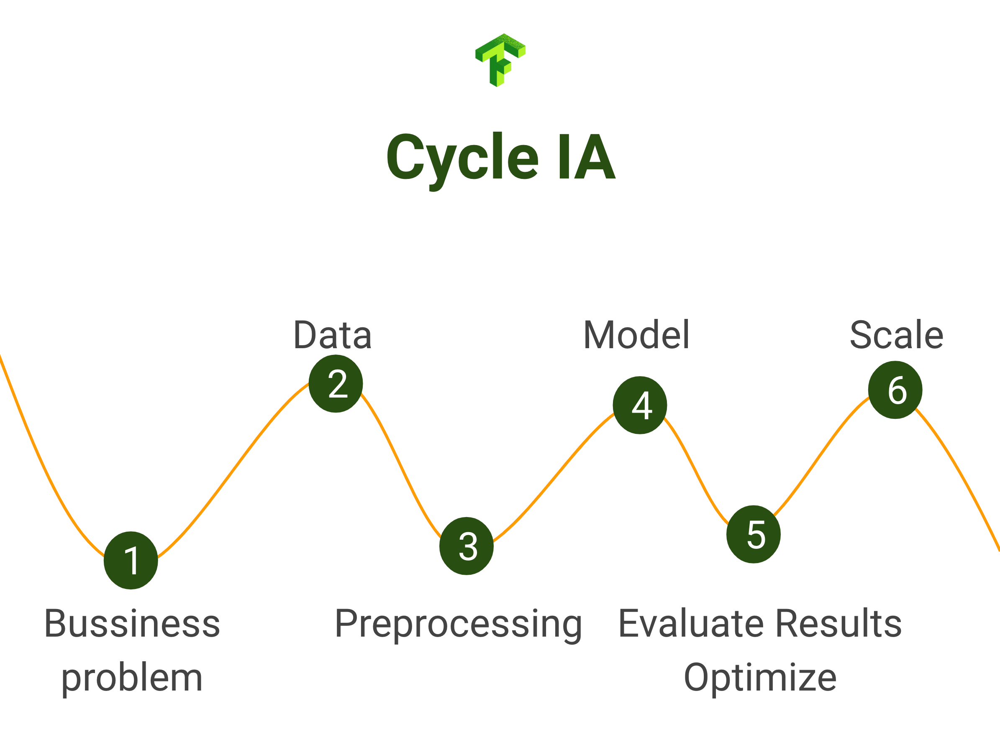

# Let's start
## Description
As the second-largest provider of carbohydrates in Africa, cassava is a key food security crop grown by smallholder farmers because it can withstand harsh conditions. At least 80% of household farms in Sub-Saharan Africa grow this starchy root, but viral diseases are major sources of poor yields. With the help of data science, it may be possible to identify common diseases so they can be treated.

Existing methods of disease detection require farmers to solicit the help of government-funded agricultural experts to visually inspect and diagnose the plants. This suffers from being labor-intensive, low-supply and costly. As an added challenge, effective solutions for farmers must perform well under significant constraints, since African farmers may only have access to mobile-quality cameras with low-bandwidth.

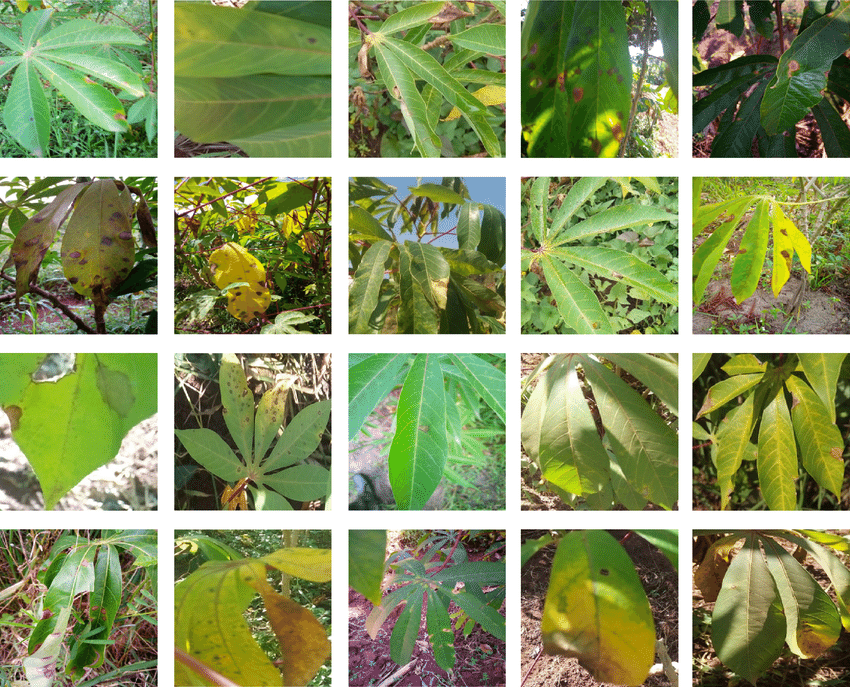

# Cassava Leaf Disease Classification
[kaggle](https://www.kaggle.com/competitions/cassava-leaf-disease-classification)


## Lets talk about models

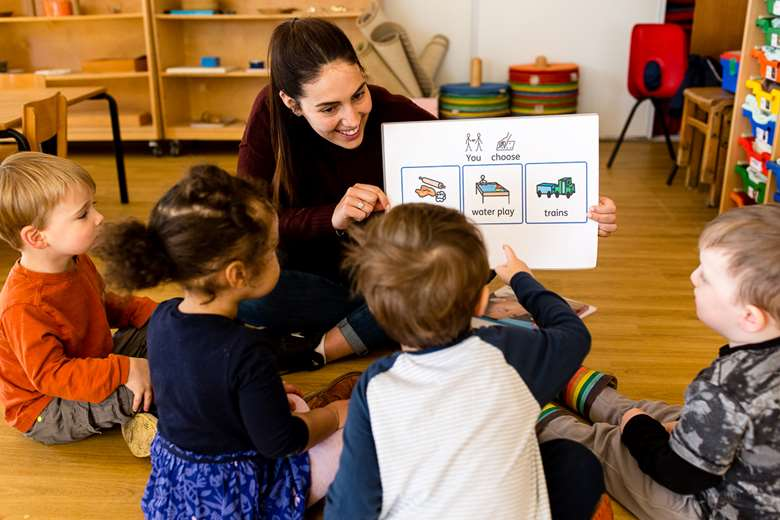

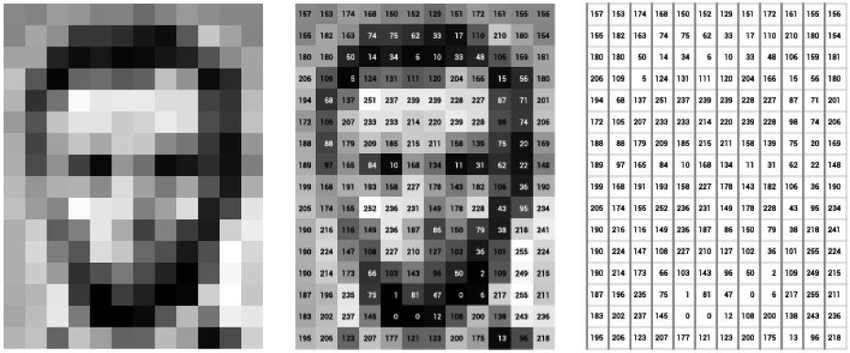

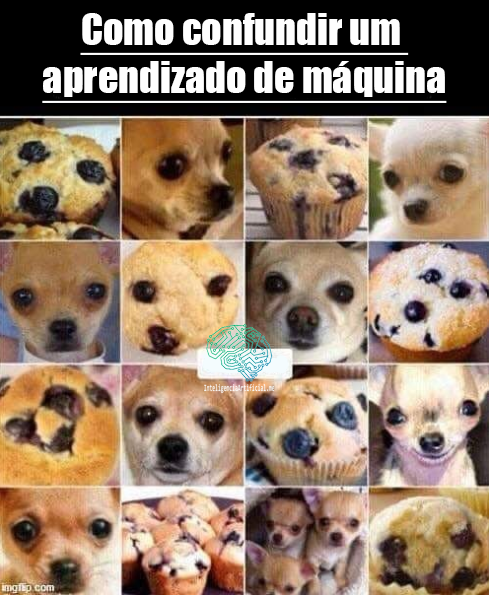

### DATASET
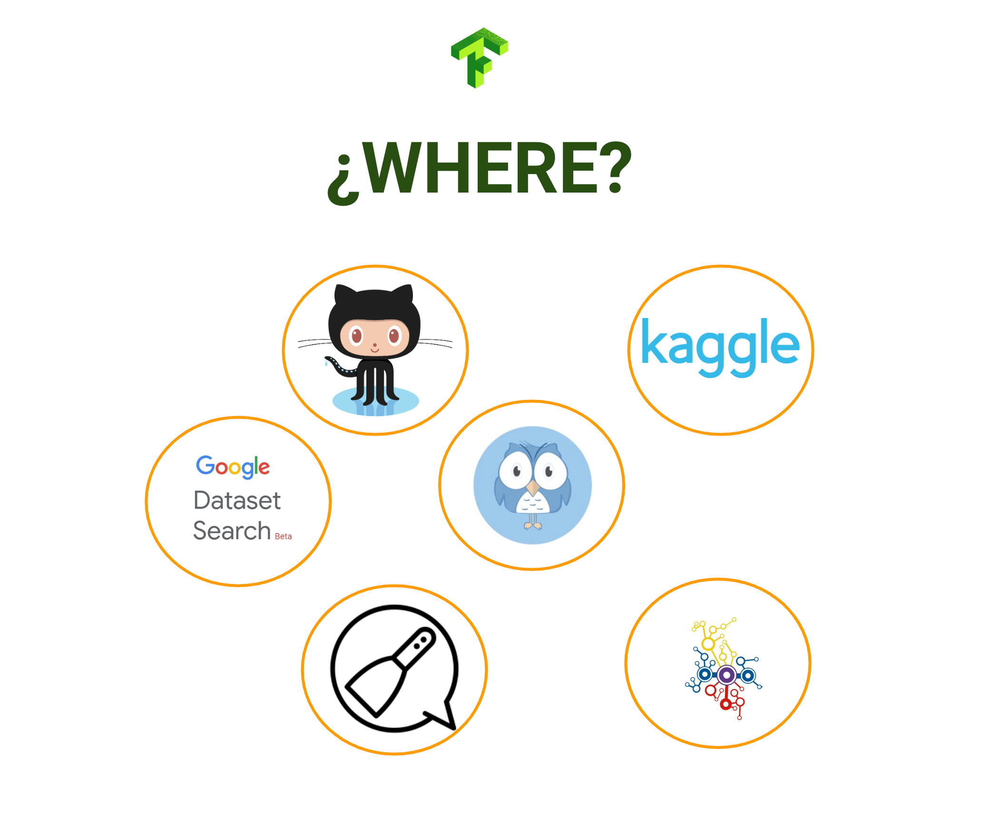

## Important to check in your dataset

*   Missing Values
*   Unbalanced data
*   Damaged images
*   Data with wrong labels
*   Noisy data

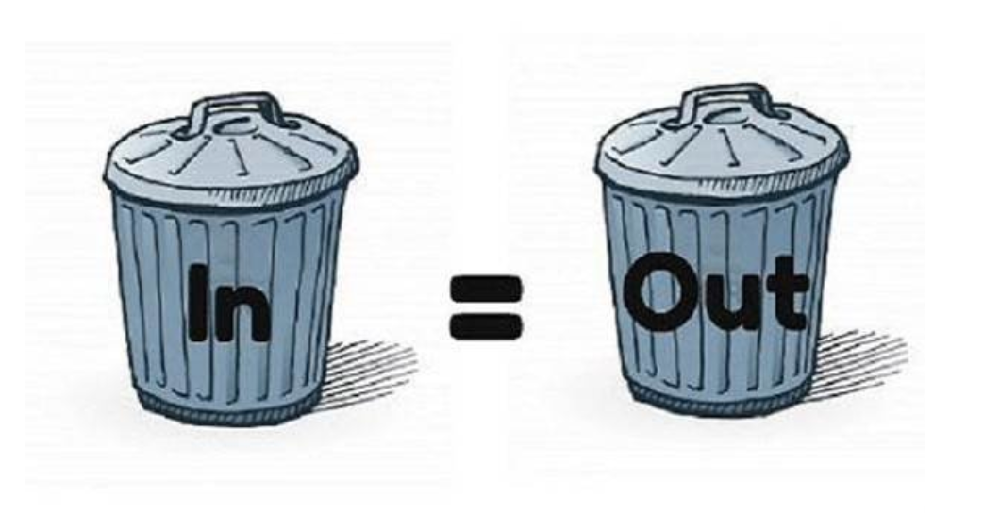

### [INFO] Dataset:
In this competition, we introduce a dataset of 21,367 labeled images collected during a regular survey in Uganda. Most images were crowdsourced from farmers taking photos of their gardens, and annotated by experts at the National Crops Resources Research Institute (NaCRRI) in collaboration with the AI lab at Makerere University, Kampala. This is in a format that most realistically represents what farmers would need to diagnose in real life.

Your task is to classify each cassava image into four disease categories or a fifth category indicating a healthy leaf. With your help, farmers may be able to quickly identify diseased plants, potentially saving their crops before they inflict irreparable damage.

#### Create the model -  Neural Network

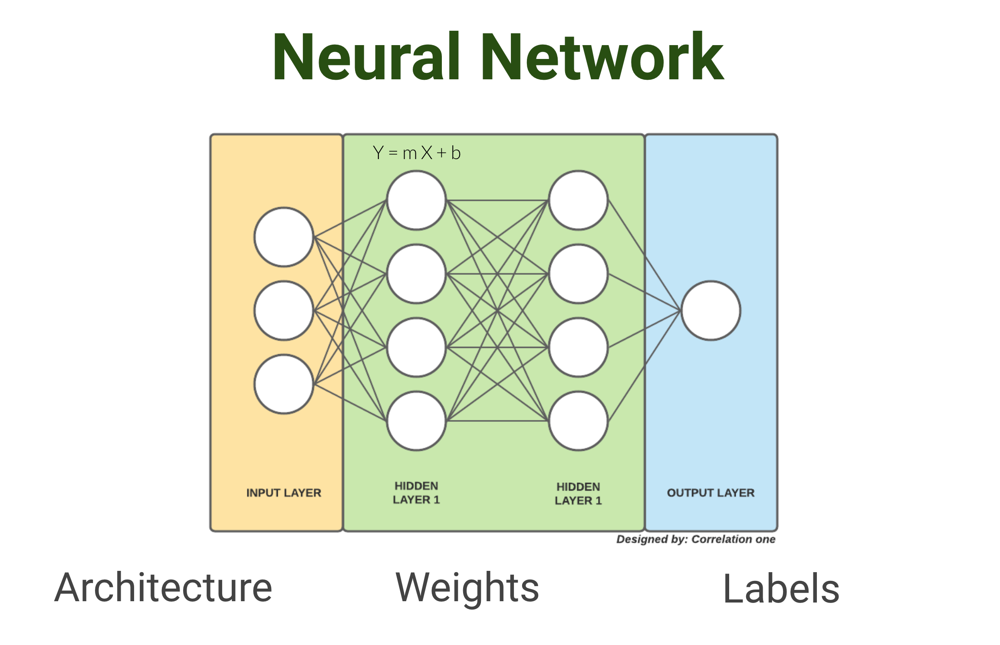

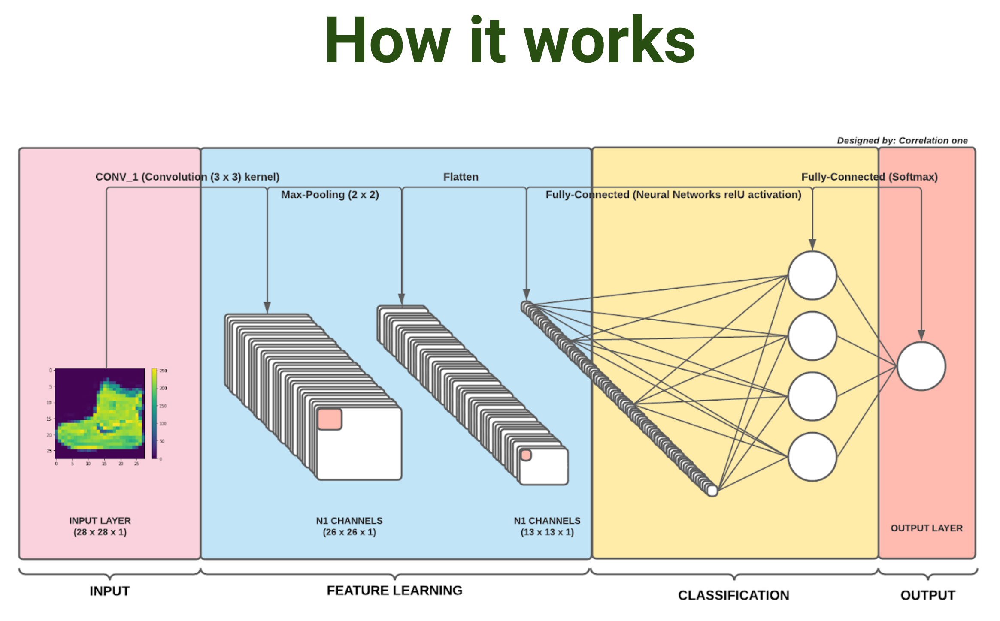

## KerasCV

KerasCV is a toolbox of modular computer vision components which provides coherent , elegant API to train state of the art computer vision models .

### KerasCV offers
*   Layers
*   Data Augmentation
*   Metrics
*   Models
*   Losses
*   Bounding box format and utilities

#### Tasks:
Task is highest level module in KerasCV . Tasks consists of backbone models and task specific layers.

#### Backbone:
Backbone models are set of reusable layers generally pretrained on a separate task .

[Source](https://www.youtube.com/watch?v=6wpY0U-aMoc&ab_channel=SouthernDataScienceConference)


## Imports & setup

This tutorial requires you to have KerasCV installed:

```shell
pip install keras-cv
```

We begin by importing all required packages:

In [2]:
!pip install keras_cv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 803.1/803.1 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 924.6/924.6 kB 10.0 MB/s eta 0:00:00


In [3]:
import numpy as np
import skimage.io as io
import random
import os
import cv2
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from glob import glob
from scipy.io import loadmat
import matplotlib.pyplot as plt
import keras_cv
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras import Sequential
import matplotlib.pyplot as plt

Using TensorFlow backend


## Data loading

This guide uses the
[Cassava Leaf Disease Dataset](https://www.kaggle.com/competitions/cassava-leaf-disease-classification)
for demonstration purposes.

To get started, we first load the dataset:
Your task is to classify each cassava image into four disease categories or a fifth category indicating a healthy leaf.


In [4]:
{"0": "Cassava Bacterial Blight (CBB)", "1": "Cassava Brown Streak Disease (CBSD)", "2": "Cassava Green Mottle (CGM)", "3": "Cassava Mosaic Disease (CMD)", "4": "Healthy"}


{'0': 'Cassava Bacterial Blight (CBB)',
 '1': 'Cassava Brown Streak Disease (CBSD)',
 '2': 'Cassava Green Mottle (CGM)',
 '3': 'Cassava Mosaic Disease (CMD)',
 '4': 'Healthy'}

In [5]:
!wget https://storage.googleapis.com/kerascvnlp_data/cassava-leaf-disease-classification.zip

--2023-09-14 20:55:06--  https://storage.googleapis.com/kerascvnlp_data/cassava-leaf-disease-classification.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.2.207, 74.125.137.207, 2607:f8b0:4023:c0b::cf, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.2.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6185662420 (5.8G) [application/zip]
Saving to: ‘cassava-leaf-disease-classification.zip’

cassava-leaf-diseas 100%[===================>]   5.76G   128MB/s    in 62s     

2023-09-14 20:56:08 (94.9 MB/s) - ‘cassava-leaf-disease-classification.zip’ saved [6185662420/6185662420]



In [6]:
!unzip -qq /content/cassava-leaf-disease-classification.zip

In [7]:
df = pd.read_csv('train.csv')
df

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
...,...,...
21392,999068805.jpg,3
21393,999329392.jpg,3
21394,999474432.jpg,1
21395,999616605.jpg,4


In [8]:
import shutil
target_folder = "dataset"
path = "train_images"

if not os.path.exists(target_folder):
    os.mkdir(target_folder)

for label in df['label'].unique():
    label_folder = os.path.join(target_folder, str(label))
    if not os.path.exists(label_folder):
        os.mkdir(label_folder)

    mask = df['label'] == label
    rows = df.loc[mask]

    for _, row in rows.iterrows():
        image_name = row['image_id']
        src_path = os.path.join(path, image_name)
        dst_path = os.path.join(label_folder, image_name)
        shutil.copy(src_path, dst_path)

## Load the dataset

In [9]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
        '/content/dataset',
        labels="inferred", # Infrared the labels depends of the folder.
        label_mode="categorical",
        class_names=None,
        color_mode="rgb",
        batch_size=16,
        image_size=(224,224),
        shuffle=True,
        seed=4,
        validation_split=0.1,
        subset="training",
        interpolation="bilinear", #It works by taking the weighted average of the four closest pixel values from the original image to estimate the value for a pixel in the resized image.
        crop_to_aspect_ratio=False
    )

valid_dataset = tf.keras.utils.image_dataset_from_directory(
            '/content/dataset',
            labels="inferred",
            label_mode="categorical",
            class_names=None,
            color_mode="rgb",
            batch_size=16,
            image_size=(224,224),
            shuffle=True,
            seed=4,
            validation_split=0.1,
            subset="validation",
            interpolation="bilinear",
            crop_to_aspect_ratio=False
        )

Found 21397 files belonging to 5 classes.
Using 19258 files for training.
Found 21397 files belonging to 5 classes.
Using 2139 files for validation.


In [10]:
def package_inputs(image, label):
    return {"images": image, "labels": label}

train_dataset = train_dataset.map(package_inputs, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = valid_dataset.map(package_inputs, num_parallel_calls=tf.data.AUTOTUNE)

## Data Augmentation

KerasCV offers several preprocessing layers for implementing data augmentation pipelines for image classification and object detection tasks like:
*   CutMix
*   MixUp
*   RandAugment : bBox functionality
*   Rescaling
*   Resizing
*   Random_shear


We use the various data augmentation layers from the KerasNLP like `RandomFlip`, `RandomCropAndResize` and `RandAugment`. We apply these augmentations to the dataset and then create the data generator for training the model.

In [11]:
NUM_CLASSES = 5
IMAGE_SIZE=(224,224)
random_flip = keras_cv.layers.RandomFlip()
augmenters = [random_flip]
crop_and_resize = keras_cv.layers.RandomCropAndResize(
    target_size=IMAGE_SIZE,
    crop_area_factor=(0.8, 1.0),
    aspect_ratio_factor=(0.9, 1.1),
)
augmenters += [crop_and_resize]
rand_augment = keras_cv.layers.RandAugment(
    augmentations_per_image=3,
    magnitude=0.3,
    value_range=(0, 255),
)
augmenters += [rand_augment]
augmenter = keras.Sequential(augmenters)
train_ds = train_dataset.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)

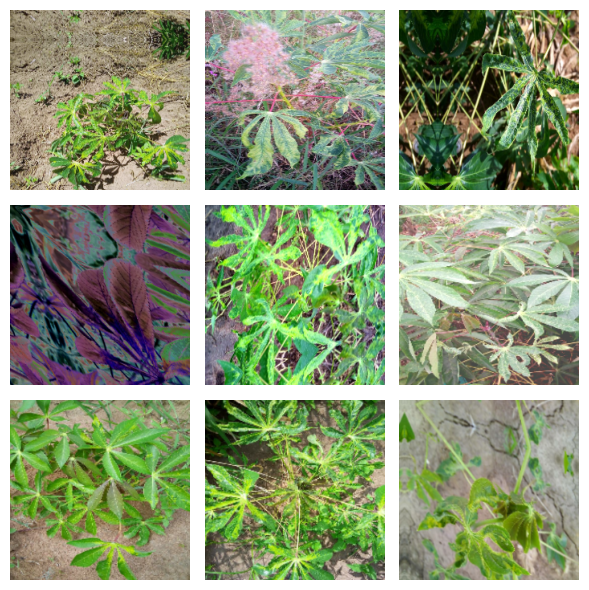

In [12]:
image_batch = next(iter(train_ds.take(1)))["images"]
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

In [13]:
def unpackage_dict(inputs):
    return inputs["images"], inputs["labels"]


train_ds = train_ds.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)
eval_ds = val_dataset.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)

## Model Building

We start with creating a warmup cosine decay callback for learning rate scheduling of the classifier. After that we create a simple image classification model using the `ResNet18 V2` backbone and train it on the loaded dataset.

More info about metrics https://www.tensorflow.org/api_docs/python/tf/keras/metrics

In [15]:
from keras import losses
import numpy as np
from keras import optimizers
from tensorflow.keras.optimizers import schedules
from keras import metrics
import math

# Parameters
total_images = 19258
EPOCHS = 5
BATCH_SIZE=16
total_steps = (total_images // BATCH_SIZE) * EPOCHS

initial_learning_rate = 0.05
decay_steps = total_steps

# Create the CosineDecay learning rate schedule
lr_schedule = schedules.CosineDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=decay_steps,
    alpha=0.0
)

# Use the learning rate schedule with the optimizer
optimizer = optimizers.legacy.SGD(
    learning_rate=lr_schedule,
    momentum=0.9,
    decay=5e-4
)

In [16]:
backbone = keras_cv.models.ResNet18V2Backbone()
model = keras.Sequential(
    [
        backbone,
        keras.layers.GlobalMaxPooling2D(),
        keras.layers.Dropout(rate=0.5),
        keras.layers.Dense(5, activation="softmax"),
    ]
)

In [17]:
loss = losses.CategoricalCrossentropy(label_smoothing=0.1)
model.compile(
    loss=loss,
    optimizer=optimizer,
    metrics=[
        metrics.CategoricalAccuracy(),
        metrics.TopKCategoricalAccuracy(k=5),
    ],
)
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 res_net_v2_backbone (ResNe  (None, None, None, 512)   11183488  
 tV2Backbone)                                                    
                                                                 
 global_max_pooling2d (Glob  (None, 512)               0         
 alMaxPooling2D)                                                 
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 5)                 2565      
                                                                 
Total params: 11186053 (42.67 MB)
Trainable params: 11178245 (42.64 MB)
Non-trainable params: 7808 (30.50 KB)
_________________________________________________________________


In [18]:
model.fit(
    train_ds,
    epochs=EPOCHS,
    verbose=1,
    validation_data=eval_ds,
)

Epoch 1/5
1204/1204 [==============================] - 439s 352ms/step - loss: 2.1826 - categorical_accuracy: 0.6018 - top_k_categorical_accuracy: 1.0000 - val_loss: 1.2630 - val_categorical_accuracy: 0.6082 - val_top_k_categorical_accuracy: 1.0000
Epoch 2/5
1204/1204 [==============================] - 409s 339ms/step - loss: 1.2574 - categorical_accuracy: 0.6155 - top_k_categorical_accuracy: 1.0000 - val_loss: 1.2569 - val_categorical_accuracy: 0.6082 - val_top_k_categorical_accuracy: 1.0000
Epoch 3/5
1204/1204 [==============================] - 404s 335ms/step - loss: 1.2538 - categorical_accuracy: 0.6156 - top_k_categorical_accuracy: 1.0000 - val_loss: 1.2493 - val_categorical_accuracy: 0.6082 - val_top_k_categorical_accuracy: 1.0000
Epoch 4/5
1204/1204 [==============================] - 402s 334ms/step - loss: 1.2521 - categorical_accuracy: 0.6160 - top_k_categorical_accuracy: 1.0000 - val_loss: 1.2461 - val_categorical_accuracy: 0.6082 - val_top_k_categorical_accuracy: 1.0000
Epoc

In [19]:
tt = train_ds.take(1)
image_batch,labels_batch = tuple(zip(*tt))

## Keras visualization
KerasCV supports various visualization utilities for
*   Drawing bounding boxes
*   Plotting bounding box gallery
*   Plotting image gallery
*   Plotting segmentation mask gallery


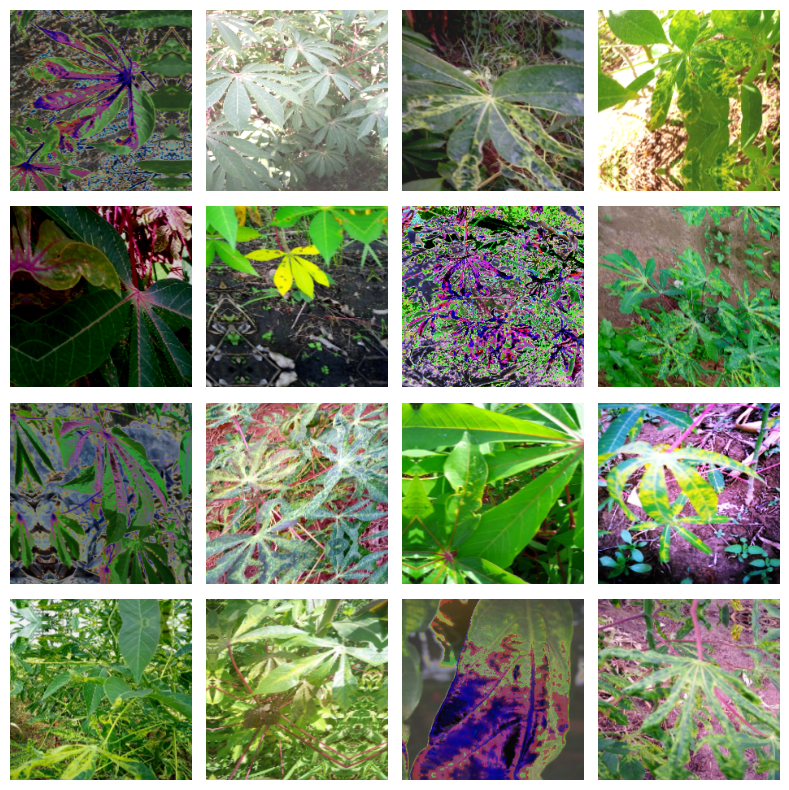

In [20]:
keras_cv.visualization.plot_image_gallery(
    image_batch[0],
    rows=4,
    cols=4,
    value_range=(0, 255),
    show=True,
)

In [21]:
pred = model.predict(image_batch[0])
print(np.argmax(pred,1))

1/1 [==============================] - 1s 513ms/step
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]


In [22]:
print(np.argmax(labels_batch[0],1))

[3 4 3 3 2 4 3 3 4 3 4 1 3 3 3 3]


## What is next ?

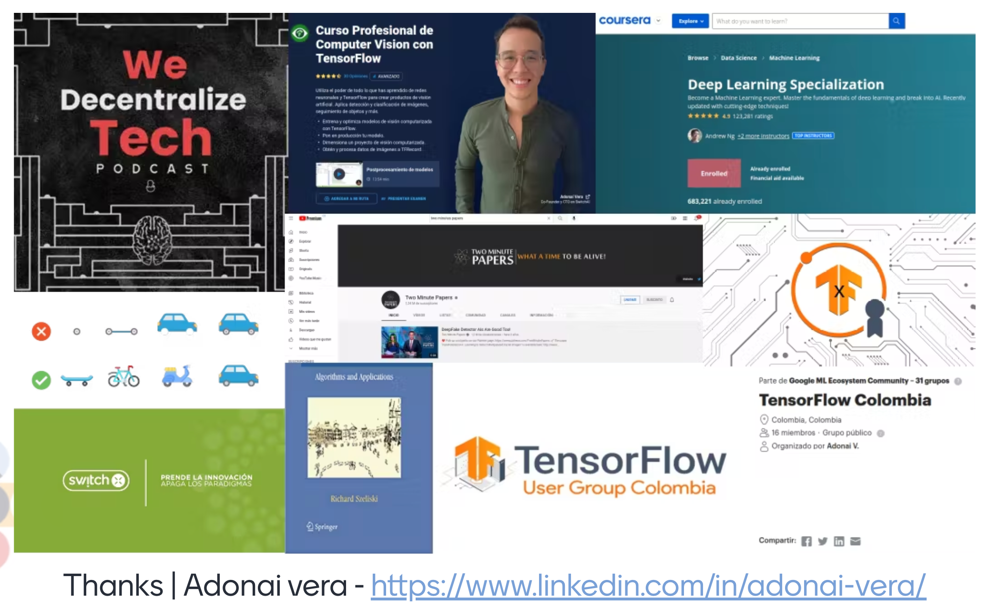

#### Thanks to Usha Rengaraju for the Demo! 👏🚀

---

